<a href="https://colab.research.google.com/github/abdalrahmenyousifMohamed/ML/blob/main/Text_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# ! pip install kaggle

# ! mkdir ~/.kaggle


# ! cp kaggle.json ~/.kaggle/

# ! chmod 600 ~/.kaggle/kaggle.json

# ! kaggle datasets download -d jiashenliu/515k-hotel-reviews-data-in-europe

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
 73% 33.0M/45.1M [00:00<00:00, 73.8MB/s]
100% 45.1M/45.1M [00:00<00:00, 79.4MB/s]


In [2]:
#  ! unzip /content/515k-hotel-reviews-data-in-europe.zip


Archive:  /content/515k-hotel-reviews-data-in-europe.zip
  inflating: Hotel_Reviews.csv       


In [3]:
! nvidia-smi

NVIDIA-SMI has failed because it couldn't communicate with the NVIDIA driver. Make sure that the latest NVIDIA driver is installed and running.



In [5]:
! pip install tensorflow_text==2.6.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 4.4 MB 7.8 MB/s 
     |████████████████████████████████| 570.3 MB 262 bytes/s 
     |████████████████████████████████| 5.6 MB 37.9 MB/s 
     |████████████████████████████████| 14.8 MB 50.7 MB/s 
     |████████████████████████████████| 132 kB 46.5 MB/s 
     |████████████████████████████████| 1.3 MB 61.0 MB/s 
     |████████████████████████████████| 462 kB 63.3 MB/s 
     |████████████████████████████████| 152 kB 65.6 MB/s 
  Created wheel for clang: filename=clang-5.0-py3-none-any.whl size=30694 sha256=973d5053031745bf276f3805bf92ee893d78c3c0bb10d22eb64dc4d730320214
  Stored in directory: /root/.cache/pip/wheels/98/91/04/971b4c587cf47ae952b108949b46926f426c02832d120a082a
  Created wheel for termcolor: filename=termcolor-1.1.0-py3-none-any.whl size=4849 sha256=1f43855aca7c7bfc3c0015ee4184b53bb29a1496a85ab8f153c454e7214d762b
  Stored in directory: /r

In [6]:
import os

os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'

In [19]:
from tqdm import tqdm
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import plotly.express as px

from numpy import newaxis
from wordcloud import WordCloud, STOPWORDS

from sklearn import preprocessing , decomposition , model_selection , metrics , pipeline
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.feature_extraction.text import TfidfVectorizer , CountVectorizer
# Truncated SVD generates the matrices with the specified number of columns,
from sklearn.decomposition import TruncatedSVD
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression

import nltk
from nltk import word_tokenize
from nltk.corpus import stopwords

import xgboost as xgb
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_text

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense , Dropout ,Embedding, LSTM , Bidirectional , Activation , GRU , BatchNormalization
from tensorflow.keras.layers import GlobalMaxPool1D , Conv1D , MaxPool1D , Flatten , SpatialDropout1D
from tensorflow.keras.preprocessing import sequence , text
from tensorflow.keras.callbacks import EarlyStopping , ReduceLROnPlateau

from tensorflow.keras.optimizers import Adam

%matplotlib inline
sns.set(style='whitegrid' , palette="muted" , font_scale=1.2)

plt.rcParams['figure.figsize'] = 12 , 8

RANDOM_SEED = 42

nltk.download('stopwords')
stop_words = stopwords.words('english')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


GPU Test

In [10]:
tf.test.gpu_device_name()

''

important Package Version

In [11]:
tf.__version__ , hub.__version__ , tensorflow_text.__version__

('2.6.5', '0.12.0', '2.6.0')

In [12]:
! pip freeze | grep hub
! pip freeze | grep tensorflow_text
! pip freeze | grep keras
! pip freeze | grep scikit-learn

en-core-web-sm @ https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-3.4.1/en_core_web_sm-3.4.1-py3-none-any.whl
tensorflow-hub==0.12.0
keras==2.6.0
keras-vis==0.4.1
scikit-learn==1.0.2


Load HUB Model
USE(Universal Sentence Encoder)

In [13]:
module_url = 'https://tfhub.dev/google/universal-sentence-encoder-multilingual-large/3'
use = hub.load(module_url)

In [14]:
txt_1 = ["the bedroom is cozy"]
txt_2 = ['comfortable bedroom']

In [15]:
emb1 = use(txt_1)
emb2 = use(txt_2)

# Embedding Dimension

In [17]:
print(emb2.shape)

(1, 512)


# Correlation

The USE is trained on a number of tasks but one of the main tasks is to identify the similarity between pairs of sentences. The authors note that the task to identify "semantic textual similarity (STS) between sentence pairs scored by Pearson correlation with human judgments"

In [23]:
print(np.inner(emb1,emb2).flatten()[0])

0.8467271


EDA

In [24]:
df_hotel_reviews = pd.read_csv("/content/Hotel_Reviews.csv")
df_hotel_reviews.head()

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968


In [25]:
df_hotel_reviews.columns.tolist()

['Hotel_Address',
 'Additional_Number_of_Scoring',
 'Review_Date',
 'Average_Score',
 'Hotel_Name',
 'Reviewer_Nationality',
 'Negative_Review',
 'Review_Total_Negative_Word_Counts',
 'Total_Number_of_Reviews',
 'Positive_Review',
 'Review_Total_Positive_Word_Counts',
 'Total_Number_of_Reviews_Reviewer_Has_Given',
 'Reviewer_Score',
 'Tags',
 'days_since_review',
 'lat',
 'lng']

In [26]:
df_hotel_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515738 entries, 0 to 515737
Data columns (total 17 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   Hotel_Address                               515738 non-null  object 
 1   Additional_Number_of_Scoring                515738 non-null  int64  
 2   Review_Date                                 515738 non-null  object 
 3   Average_Score                               515738 non-null  float64
 4   Hotel_Name                                  515738 non-null  object 
 5   Reviewer_Nationality                        515738 non-null  object 
 6   Negative_Review                             515738 non-null  object 
 7   Review_Total_Negative_Word_Counts           515738 non-null  int64  
 8   Total_Number_of_Reviews                     515738 non-null  int64  
 9   Positive_Review                             515738 non-null  object 
 

In [27]:
df_hotel_reviews.describe().T

,count,mean,std,min,25%,50%,75%,max
Additional_Number_of_Scoring,515738.0,498.081836,500.538467,1.000000,169.000000,341.000000,660.000000,2682.000000
Average_Score,515738.0,8.397487,0.548048,5.200000,8.100000,8.400000,8.800000,9.800000
Review_Total_Negative_Word_Counts,515738.0,18.539450,29.690831,0.000000,2.000000,9.000000,23.000000,408.000000
Total_Number_of_Reviews,515738.0,2743.743944,2317.464868,43.000000,1161.000000,2134.000000,3613.000000,16670.000000
Review_Total_Positive_Word_Counts,515738.0,17.776458,21.804185,0.000000,5.000000,11.000000,22.000000,395.000000
Total_Number_of_Reviews_Reviewer_Has_Given,515738.0,7.166001,11.040228,1.000000,1.000000,3.000000,8.000000,355.000000
Reviewer_Score,515738.0,8.395077,1.637856,2.500000,7.500000,8.800000,9.600000,10.000000
lat,512470.0,49.442439,3.466325,41.328376,48.214662,51.499981,51.516288,52.400181
lng,512470.0,2.823803,4.579425,-0.369758,-0.143372,0.010607,4.834443,16.429233


In [28]:
df_hotel_reviews.describe(include='object').T

,count,unique,top,freq
Hotel_Address,515738,1493,163 Marsh Wall Docklands Tower Hamlets London ...,4789
Review_Date,515738,731,8/2/2017,2585
Hotel_Name,515738,1492,Britannia International Hotel Canary Wharf,4789
Reviewer_Nationality,515738,227,United Kingdom,245246
Negative_Review,515738,330011,No Negative,127890
Positive_Review,515738,412601,No Positive,35946
Tags,515738,55242,"[' Leisure trip ', ' Couple ', ' Double Room '...",5101
days_since_review,515738,731,1 days,2585


Review Score

In [29]:
df_hotel_reviews.Reviewer_Score.describe().T

count    515738.000000
mean          8.395077
std           1.637856
min           2.500000
25%           7.500000
50%           8.800000
75%           9.600000
max          10.000000
Name: Reviewer_Score, dtype: float64

In [30]:
fig = px.histogram(df_hotel_reviews , x = "Reviewer_Score" , title='Review Score Distribution' , nbins=20 , text_auto=True)
fig.show()

Review Sentiment Distribution

In [32]:
print(f"Total Positive Word Count {df_hotel_reviews.Review_Total_Positive_Word_Counts.sum()} , Total Negative Word Count {df_hotel_reviews.Review_Total_Negative_Word_Counts.sum()}")

Total Positive Word Count 9167995 , Total Negative Word Count 9561499


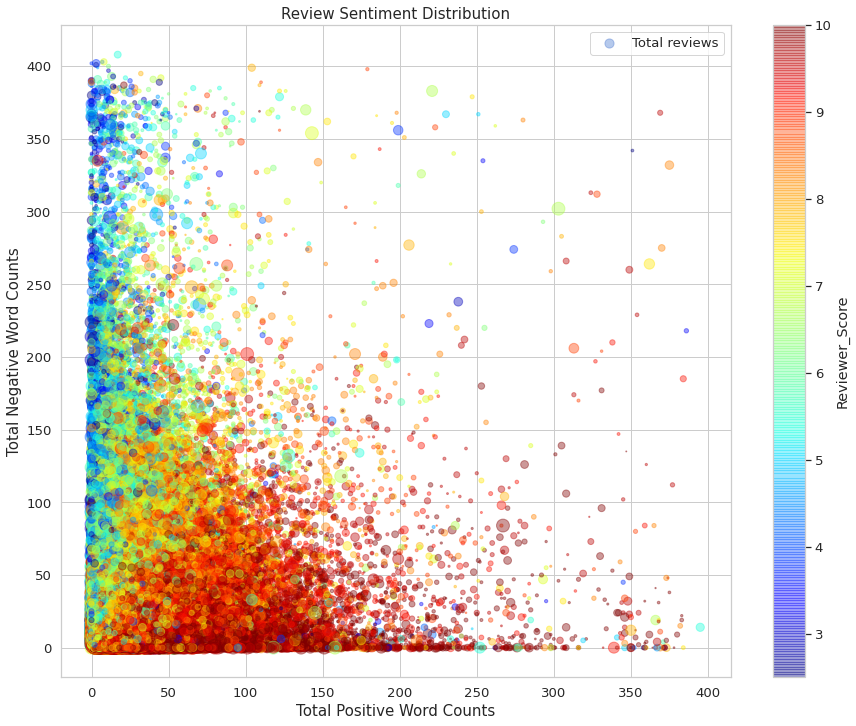

In [53]:
df_hotel_reviews.plot(kind='scatter' , x= 'Review_Total_Positive_Word_Counts',
                      y='Review_Total_Negative_Word_Counts',
                      label = 'Total reviews',
                      s = df_hotel_reviews.Total_Number_of_Reviews/100,
                      c = 'Reviewer_Score',
                      cmap = plt.get_cmap('jet'),
                      colorbar=True,
                      alpha=0.4  , figsize=(15,12),
                      sharex=False # label not showing up 
                      
                      )

font_size = 15
plt.title('Review Sentiment Distribution' , fontsize=font_size)
plt.xlabel("Total Positive Word Counts" , fontsize=font_size)
plt.ylabel('Total Negative Word Counts' , fontsize=font_size)
plt.legend()
plt.show()

From the above graph , we can infer that - 

- The value of Total Positive word counts is lower than total negative word counts

- Although the distribution of positive review seems to dominate negative reviews , the distribution of negative review has higher negative word count in general

Reciewer Nationality

Top 20

In [54]:
df_hotel_reviews.Reviewer_Nationality.value_counts()[:20]

 United Kingdom               245246
 United States of America      35437
 Australia                     21686
 Ireland                       14827
 United Arab Emirates          10235
 Saudi Arabia                   8951
 Netherlands                    8772
 Switzerland                    8678
 Germany                        7941
 Canada                         7894
 France                         7296
 Israel                         6610
 Italy                          6114
 Belgium                        6031
 Turkey                         5444
 Kuwait                         4920
 Spain                          4737
 Romania                        4552
 Russia                         3900
 South Africa                   3821
Name: Reviewer_Nationality, dtype: int64

In [55]:
fig = px.histogram(df_hotel_reviews , x = 'Average_Score' , title = ' review Average Score Distribution')
fig.show()

Positive Vs Negative Word Count Among Hotel Reviews

In [56]:
px.histogram(x = abs(df_hotel_reviews.Review_Total_Positive_Word_Counts - df_hotel_reviews.Review_Total_Negative_Word_Counts)
, title = ' Difference Between Total Positive and Negative Word Count Among Hotel Reviews'
)

Data Preprocessing 

Cleaning Review Text


> There are some values like No Positive in positive review and No Negative in negative review which can be counted as opposite sentiment , hence replacing those phrases



In [57]:
# outliers
df_hotel_reviews['Negative_Review'][1]

'No Negative'

In [58]:
df_hotel_reviews.loc[:,'Positive_Review'] = df_hotel_reviews.Positive_Review.apply(lambda x : x.replace('No Positive' , ''))

df_hotel_reviews.loc[:,'Negative_Review'] = df_hotel_reviews.Negative_Review.apply(lambda x:x.replace('No Negative' , ''))

In [59]:
df_hotel_reviews['Negative_Review'][1]

''

Merge Feature (Both Review Text)


> i will merge texts from both positive and negative review columns to merge into a single text feature



In [60]:
df_hotel_reviews['review'] = df_hotel_reviews.Positive_Review + df_hotel_reviews.Negative_Review

Set Sentiment Type


> Setting the sentiment threshold to 7 , everything is negative below 7



In [61]:
df_hotel_reviews['review_type'] = df_hotel_reviews['Reviewer_Score'].apply(lambda x : "bad" if x < 7 else "good")


In [62]:
df_reviews = df_hotel_reviews[['review' , 'review_type']]

# Final Preprocessed DataSet

In [63]:
df_reviews.head()

,review,review_type
0,Only the park outside of the hotel was beauti...,bad
1,No real complaints the hotel was great great ...,good
2,Location was good and staff were ok It is cut...,good
3,Great location in nice surroundings the bar a...,bad
4,Amazing location and building Romantic settin...,bad


In [65]:
#  df_reviews.review_type.hist()

fig = px.histogram(df_reviews , x = "review_type" , title='Review Type Distribution' , text_auto=True)
fig.show()
# imbalanced distribution

Text labeled as Good

In [66]:
df_reviews[df_reviews.review_type == 'good'].review.value_counts()

 Location                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           947
 Everything Nothing                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 938
 Everything             

In [67]:
df_reviews[df_reviews.review_type == 'bad'].review.value_counts()

 Nothing Everything                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  124
 Location                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

In [70]:
good_reviews = df_reviews[df_reviews.review_type == 'good']
bad_reviews = df_reviews[df_reviews.review_type == 'bad']

In [76]:
res = " ".join(good_reviews.review.to_numpy().tolist())


In [77]:
print(res)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



# Word Cloud

In [86]:
good_review_text1 = " ".join(good_reviews.review.to_numpy().tolist())
bad_review_text1 = " ".join(bad_reviews.review.to_numpy().tolist(
))

In [87]:
len(good_review_text1)

74210542

In [84]:
# generate Word Cloud
def gen_wc(txt):
  stopwords = set(STOPWORDS)

  wc = WordCloud(width=800 , height=400 , background_color="white",
                 
                 max_font_size=300 , stopwords = stopwords
                 ).generate(txt)
  plt.figure(figsize=(14,10))
  plt.imshow(wc , interpolation='bilinear')
  plt.axis('off')
  plt.show()

Good Reviews

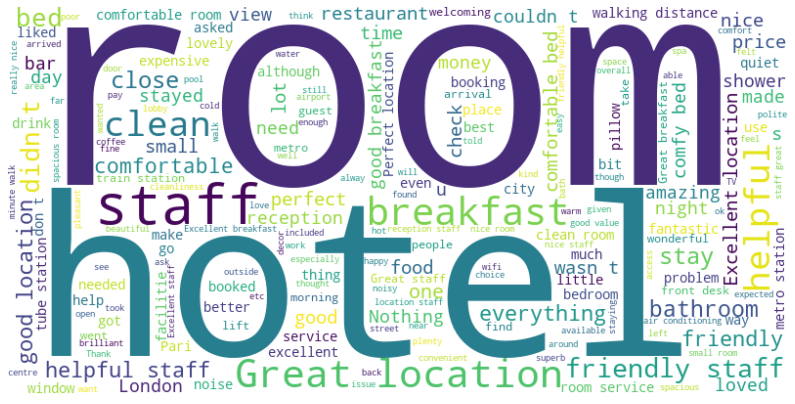

In [88]:
gen_wc(good_review_text1)

Bad Reviews

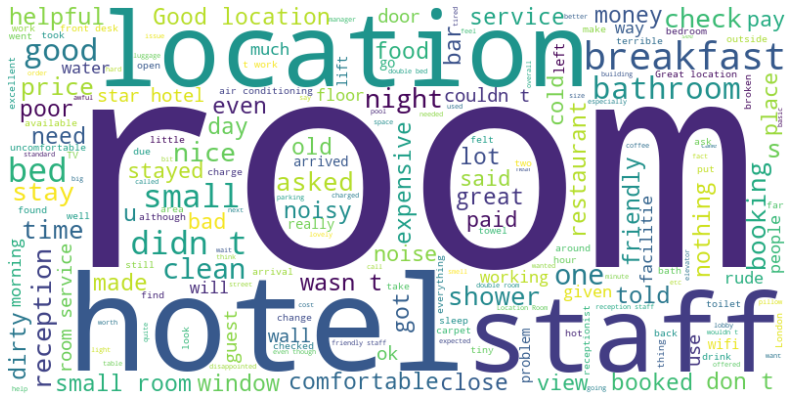

In [90]:
gen_wc(bad_review_text1)

# Resample DataSet
Under sample the positive to achieve a balanced distribution betweeen reviews

In [93]:
good_df = good_reviews.sample(n=len(bad_reviews) , random_state=RANDOM_SEED)

df_review_resampled = good_df.append(bad_reviews).reset_index(drop=True)
df_review_resampled.shape

(173702, 2)

After Resampled

Text(0.5, 1.0, 'Review type (resampled)')

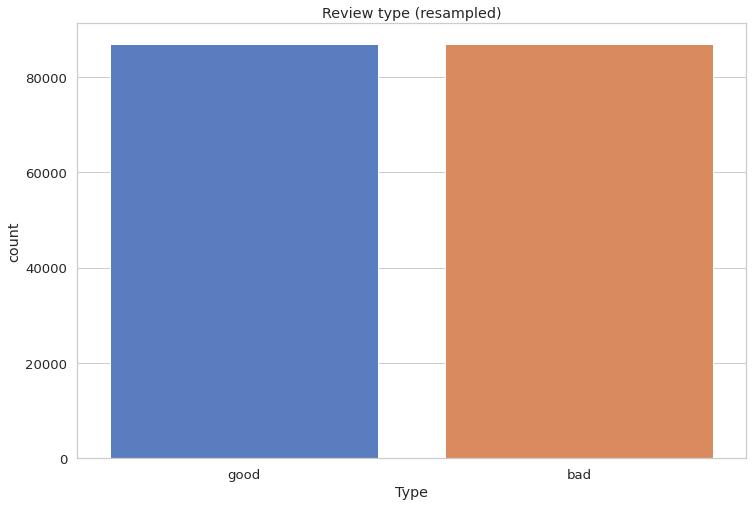

In [96]:
sns.countplot(x='review_type' , data = df_review_resampled , order = df_review_resampled.review_type.value_counts().index)
plt.xlabel("Type")
plt.title("Review type (resampled)")

In [101]:
df_review_resampled.review_type

0         good
1         good
2         good
3         good
4         good
          ... 
173697     bad
173698     bad
173699     bad
173700     bad
173701     bad
Name: review_type, Length: 173702, dtype: object

Data Preparation

Encoding Labels

In [102]:
# one_hot_encoder = preprocessing.OneHotEncoder(sparse=False)
# encoded_review = one_hot_encoder.fit_transform(df_review_resampled.review_type.to_numpy().reshape(-1,1))

label_enc = preprocessing.LabelEncoder()
encoded_review = label_enc.fit_transform(df_review_resampled.review_type.values)

In [103]:
encoded_review

array([1, 1, 1, ..., 0, 0, 0])

Train / Test split

In [104]:
train_reviews , test_reviews , y_train , y_test = train_test_split(
    df_review_resampled.review,encoded_review,test_size=0.25 , random_state=RANDOM_SEED
)


# Modeling

**Feature Engineering**

TF-IDF

In [ ]:
%%time
tfv = TfidfVectorizer(min_df = 3 , max_features=None , strip_accents='unicode' , analyzer='word',token_pattern=r'\w{1,}')